In [15]:
from dendrocat import RadioSource, MasterCatalog
from astropy.io import fits
from spectral_cube import SpectralCube
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import sys
import importlib
from astropy.wcs import WCS
from regions import Regions, PixCoord
from astropy import stats
from itertools import chain
import dendrocat
from scipy import stats
import Paths.Paths as paths
from astropy.table import vstack, Table
Path = paths.filepaths()

In [16]:
def add_skycoordinates(cat, wcs):
    """
    Add sky coordinates to the catalog based on WCS information.
    
    Parameters:
    cat : dict
        The catalog containing peak_x and peak_y pixel coordinates.
    wcs : astropy.wcs.WCS
        The WCS object for converting pixel coordinates to sky coordinates.
    
    Returns:
    None: The function modifies the input catalog in place.
    """
    xypix = np.column_stack((cat['peak_x'].data, cat['peak_y'].data))
    xysky = wcs.wcs_pix2world(xypix, 0)
    cat['peak_x_sky'] = xysky[:, 0]
    cat['peak_y_sky'] = xysky[:, 1]

    
    

def check_overlap(image_dir1, image_dir2, cat1, cat2):
    cats = [cat1, cat2]
    print(cat1)
    catnum1 = len(cat1['peak_x_sky'])
    catnum2 = len(cat2['peak_y_sky'])
    isinside1 = np.zeros(catnum1, dtype=bool)
    isinside2 = np.zeros(catnum2, dtype=bool)
    isinsides = [isinside1, isinside2]
    image_dirs = [image_dir1, image_dir2]
    catnums = [catnum1, catnum2]
    for i, image_dir in enumerate(image_dirs):
        fitsdata = fits.open(image_dir)
        wcs = WCS(fitsdata[0].header,naxis=2)
        image = fitsdata[0].data[0][0]
        if len(image.shape)>2:
            image = fitsdata[0].data[0][0]

        cat_comp = cats[i] ; cat = cats[i-1]

        xpeak = cat['peak_x_sky']
        ypeak = cat['peak_y_sky']

        xypeak = np.vstack((xpeak,ypeak)).T

        xypix = wcs.wcs_world2pix(xypeak,0)
        
        for j in range(catnums[i-1]):
            if xypix[j,0] < 0 or xypix[j,1] < 0 or xypix[j,0]>=image.shape[0] or xypix[j,1] >= image.shape[1]:
                isinsides[i-1][j] = False
            
            else:
                isinsides[i-1][j] = np.isfinite(image[int(xypix[j,0]),int(xypix[j,1])])
                
    return isinsides

def auto_matching(cat1, cat2, threshold=0.01, verbose=False):
    
    catnum1 = len(cat1['peak_x_sky'])
    matchingind = []            
    for i in range(catnum1):
        dist = np.sqrt((cat1['peak_x_sky'][i] - cat2['peak_x_sky'])**2
                      +(cat1['peak_y_sky'][i] - cat2['peak_y_sky'])**2)
        if verbose:
            print(i,cat1['_name'][i],cat2['_name'][np.argmin(dist)],np.min(dist),np.argmin(dist))
        if np.min(dist) < threshold:
            matchingind.append(np.argmin(dist))
        else:
            matchingind.append(-1)

        
    return np.array(matchingind)                       


def matching_main(b3cat, b6cat, b3fits, b6fits, threshold=7.588286987609E-06,label='w51e'):
    add_skycoordinates(b3cat, WCS(fits.open(b3fits)[0].header, naxis=2))
    add_skycoordinates(b6cat, WCS(fits.open(b6fits)[0].header, naxis=2))
    isinsides = check_overlap(b3fits, b6fits,b3cat, b6cat)
    b6_to_b3_ind = auto_matching(b3cat, b6cat, threshold=threshold, verbose=False)
    b3_to_b6_ind = auto_matching(b6cat, b3cat, threshold=threshold, verbose=False)   

    b3_ind_counterpart = np.where(b6_to_b3_ind>=0)
    b3_counterpart = b3cat[b3_ind_counterpart]
    b6_counterpart = b6cat[b6_to_b3_ind[b3_ind_counterpart]]

    table_matched = Table([b3_counterpart['_name'], b6_counterpart['_name'], 
                        b3_counterpart['peak_x'], b3_counterpart['peak_y'],
                        b6_counterpart['peak_x'], b6_counterpart['peak_y'],
                        b3_counterpart['peak_x_sky'], b3_counterpart['peak_y_sky'],
                        b6_counterpart['peak_x_sky'], b6_counterpart['peak_y_sky'],
                        b3_counterpart['major_fwhm'], b3_counterpart['minor_fwhm'], b3_counterpart['position_angle'],
                        b6_counterpart['major_fwhm'], b6_counterpart['minor_fwhm'], b6_counterpart['position_angle'],
                        np.ones(len(b3_ind_counterpart[0]), dtype=bool), isinsides[0][b3_ind_counterpart]],
                    names=('b3_id','b6_id','b3_xpix','b3_ypix','b6_xpix','b6_ypix',
                            'b3_xsky','b3_ysky','b6_xsky','b6_ysky',
                            'b3_afwhm', 'b3_bfwhm', 'b3_pa',
                            'b6_afwhm', 'b6_bfwhm', 'b6_pa',
                            'is_matched','is_overlap')  
                    )
    print(len(table_matched))                    
    b3_ind_nomatch = np.where(b6_to_b3_ind<0)
    b3only = b3cat[b3_ind_nomatch]
    b3only_num = len(b3_ind_nomatch[0])
    dummyarr = np.ones(b3only_num)*(-1)
    dummyarr_str = np.zeros(b3only_num, dtype=str)
    table_b3only = Table([b3only['_name'], dummyarr_str,
                        b3only['peak_x'], b3only['peak_y'],
                        dummyarr, dummyarr,
                        b3only['peak_x_sky'], b3only['peak_y_sky'],
                        dummyarr, dummyarr,
                        b3only['major_fwhm'], b3only['minor_fwhm'], b3only['position_angle'],
                        dummyarr, dummyarr, dummyarr,
                        np.zeros(b3only_num, dtype=bool), isinsides[0][b3_ind_nomatch]],
                        names=('b3_id','b6_id','b3_xpix','b3_ypix','b6_xpix','b6_ypix',
                            'b3_xsky','b3_ysky','b6_xsky','b6_ysky',
                                'b3_afwhm', 'b3_bfwhm', 'b3_pa',
                            'b6_afwhm', 'b6_bfwhm', 'b6_pa',
                            'is_matched','is_overlap')  
                        )

    print(len(table_b3only))                    
                        
    b6_ind_nomatch = np.where(b3_to_b6_ind<0)
    b6only = b6cat[b6_ind_nomatch]
    b6only_num = len(b6_ind_nomatch[0])
    dummyarr = np.ones(b6only_num)*(-1)
    dummyarr_str = np.zeros(b6only_num, dtype=str)
    table_b6only = Table([dummyarr_str, b6only['_name'], 
                        dummyarr, dummyarr,
                        b6only['peak_x'], b6only['peak_y'],
                        dummyarr, dummyarr,
                        b6only['peak_x_sky'], b6only['peak_y_sky'],
                        dummyarr, dummyarr, dummyarr,
                        b6only['major_fwhm'], b6only['minor_fwhm'], b6only['position_angle'],
                        np.zeros(b6only_num, dtype=bool), isinsides[1][b6_ind_nomatch]],
                        names=('b3_id','b6_id','b3_xpix','b3_ypix','b6_xpix','b6_ypix',
                            'b3_xsky','b3_ysky','b6_xsky','b6_ysky',
                            'b3_afwhm', 'b3_bfwhm', 'b3_pa',
                            'b6_afwhm', 'b6_bfwhm', 'b6_pa',
                            'is_matched','is_overlap')  
                        )
    print(len(table_b6only))                    

    table_fin = vstack([table_matched, table_b3only, table_b6only])
    sortind = np.lexsort((table_fin['b6_id'],~table_fin['is_matched'],~table_fin['is_overlap']))
    table_fin = table_fin[sortind]








    table_fin.write(f'tables/dendro_{label}_matched.fits', format='fits', overwrite=True)

    print(len(table_fin))        

def plot_matched_catalog(matched_cat, fitsfile, label='w51e'):
    table_fin = Table.read(matched_cat)

 
    w51e_ra = []
    w51e_dec = []
    b3only = []
    b6only = []
    both = []
    for i in range(len(table_fin)): 
        if table_fin['b6_xsky'][i] < 0:
            w51e_ra.append(table_fin['b3_xsky'][i])
            w51e_dec.append(table_fin['b3_ysky'][i])
            b3only.append(i)
        else:
            w51e_ra.append(table_fin['b6_xsky'][i])
            w51e_dec.append(table_fin['b6_ysky'][i])
            if table_fin['b3_xsky'][i] < 0:
                b6only.append(i)
            else:
                both.append(i)

  
    fig = plt.figure(figsize=(30,30))
    ax = fig.add_subplot(111)
    w51e_b3_fitsdata = fits.open(fitsfile)
    w51e_b3_image = w51e_b3_fitsdata[0].data
    ax.imshow(w51e_b3_image[0][0], origin='lower', cmap=plt.get_cmap('inferno'),vmin=-0.000311680, vmax=0.001241484998551493)
    wcs_w51e_b3 = WCS(w51e_b3_fitsdata[0].header,naxis=2)
    pixxy = wcs_w51e_b3.wcs_world2pix(np.array(w51e_ra), np.array(w51e_dec), 0)
    
    ax.scatter(np.array(pixxy[0])[both], np.array(pixxy[1])[both], marker='o', facecolor='none',edgecolor='cyan', s=100, label='both')
    ax.scatter(np.array(pixxy[0])[b3only], np.array(pixxy[1])[b3only], marker='o', facecolor='none',edgecolor='magenta', s=100, label='B3 only')
    ax.scatter(np.array(pixxy[0])[b6only], np.array(pixxy[1])[b6only], marker='o', facecolor='none',edgecolor='orange', s=100, label='B6 only')
    ax.legend(fontsize=40)
    plt.savefig('pngs/matched_{label}.png')    
            
    

In [17]:
w51e_B3_catalog = 'tables/W51-E_B3_truncated_dendro.fits'
w51e_B6_catalog = 'tables/W51-E_B6_truncated_dendro.fits'
w51n_B3_catalog = 'tables/W51-IRS2_B3_truncated_dendro.fits'
w51n_B6_catalog = 'tables/W51-IRS2_B6_truncated_dendro.fits'


from astropy.table import Table
w51e_b3_cat = Table.read(w51e_B3_catalog)
w51e_b6_cat = Table.read(w51e_B6_catalog)
w51n_b3_cat = Table.read(w51n_B3_catalog)
w51n_b6_cat = Table.read(w51n_B6_catalog)



In [18]:
matching_main(w51e_b3_cat, w51e_b6_cat, Path.w51e_b3_tt0, Path.w51e_b6_cont, threshold=7.588286987609E-06, label='w51e')
matching_main(w51n_b3_cat, w51n_b6_cat, Path.w51n_b3_tt0, Path.w51n_b6_cont, threshold=7.588286987609E-06, label='w51n')



 _idx _index  _name   ... id_count     peak_x_sky         peak_y_sky    
                      ...                                               
----- ------ -------- ... -------- ------------------ ------------------
17773  15385 93017773 ...        3  290.9275677269126 14.500596605128557
19416  16692 93019416 ...        3   290.927746466834 14.501008831367187
23750  20373 93023750 ...        3  290.9266458154624 14.502191026751968
27831  24189 93027831 ...        3  290.9228357244253 14.504067283106435
30993  26771 93030993 ...        3  290.9323236580427 14.505409165819163
31160  26843 93031160 ...        3  290.9323698526286 14.505461665938908
31210  26857 93031210 ...        3  290.9324542082429 14.505457777245084
31450  26932 93031450 ...        2  290.9324642504769  14.50550249948864
31827  27160 93031827 ...        2  290.9323316912753  14.50563277695228
33120  27646 93033120 ...        3 290.93224934308944 14.505939998942365
  ...    ...      ... ...      ...                .

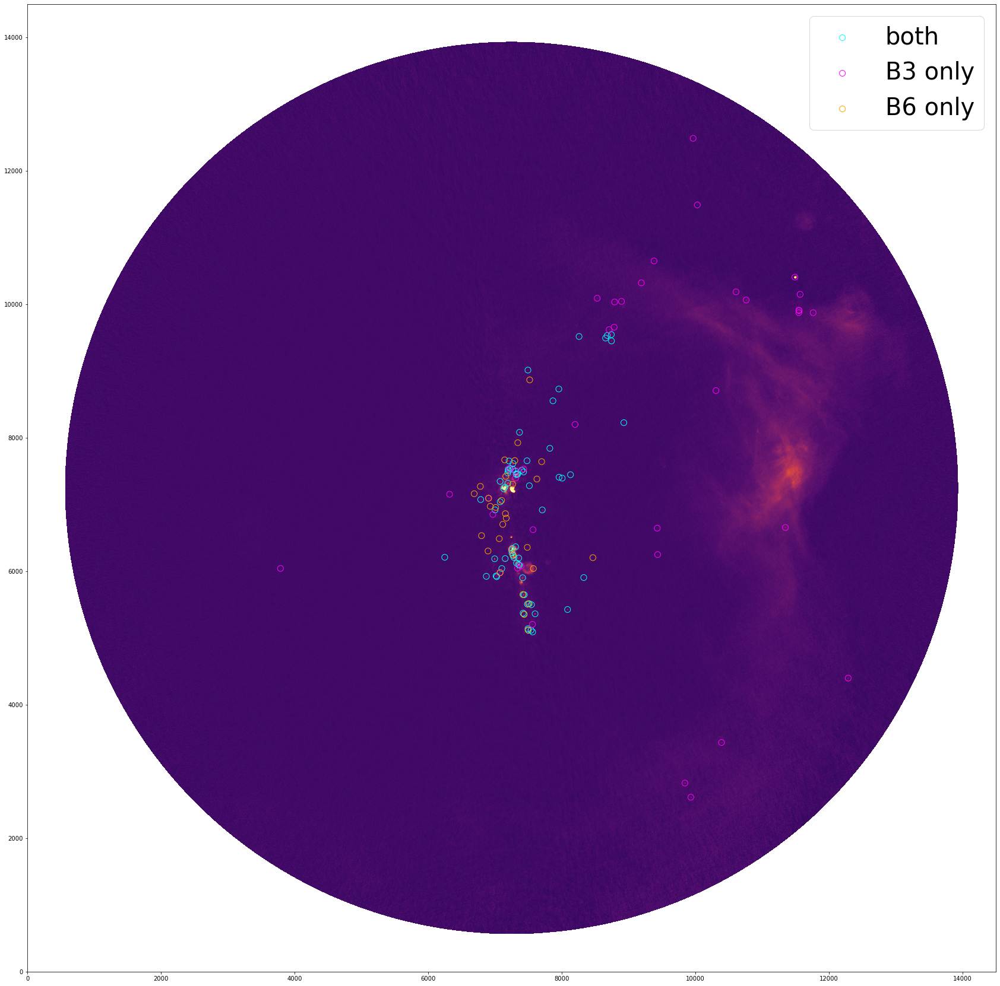

In [19]:
plot_matched_catalog('tables/dendro_w51e_matched.fits', Path.w51e_b3_tt0, label='w51e')


###Making combined catalog

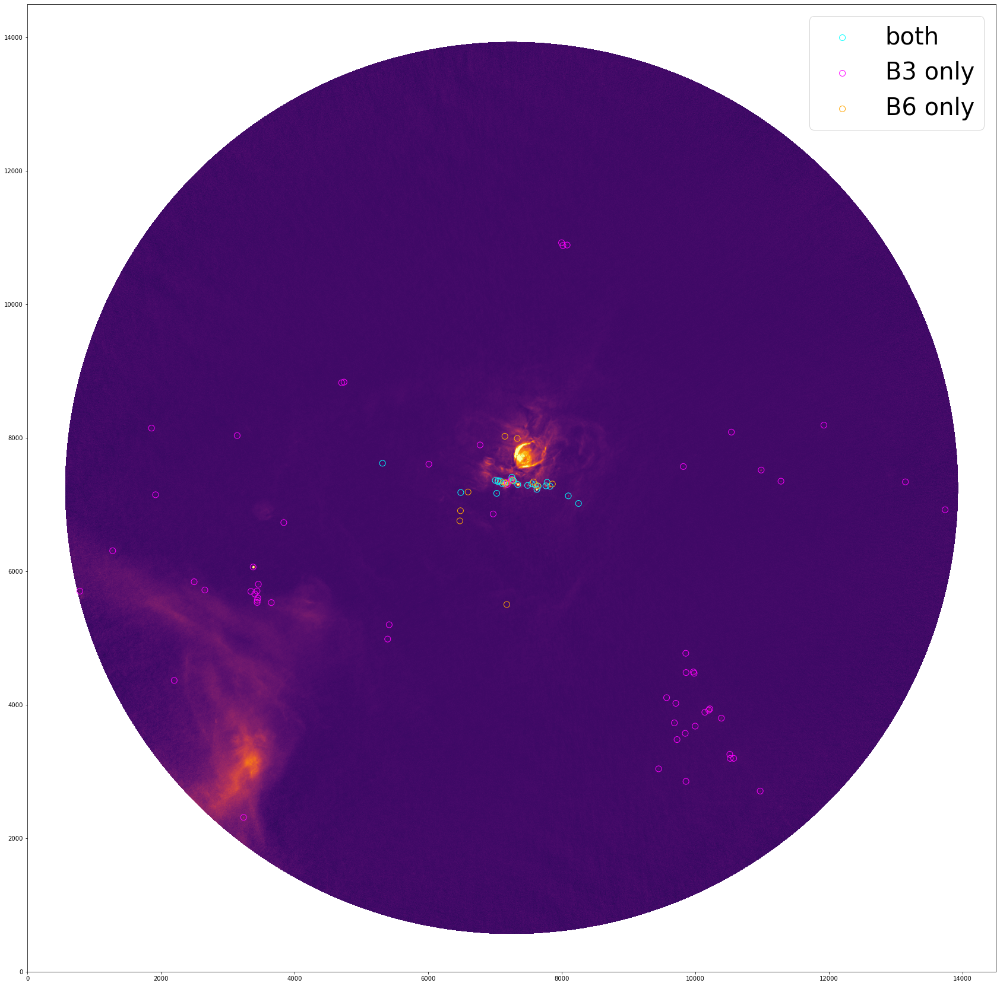

In [20]:

plot_matched_catalog('tables/dendro_w51n_matched.fits', Path.w51n_b3_tt0, label='w51n')


In [21]:
source_num = len(table_fin)
hdr_b3 = fits.getheader(w51e_b3_tt0)
hdr_b6 = fits.getheader(w51e_b6_calibrated_pbcor)

beam_b3 = Beam.from_fits_header(hdr_b3)    
beam_b6 = Beam.from_fits_header(hdr_b6)    


NameError: name 'table_fin' is not defined

0 290.9323236580427 14.505409165819163 290.93232480562904 14.50541222136782 930000 2260000
1 290.9295792256517 14.511508551611088 290.92958280761815 14.511510946414232 93008571 226000162


2 290.9324542082429 14.505457777245084 290.932455642757 14.505459999460392 930002 2260003
3 290.9323698526286 14.505461665938908 290.932371860991 14.505463332600574 930003 2260004
4 290.9324642504769 14.50550249948864 290.9324648242204 14.505504443924297 930004 2260006
5 290.93224934308944 14.505939998942365 290.9322524991548 14.505941110052976 930008 2260013
6 290.932584757782 14.505932221933161 290.9325841838294 14.505934444144511 930009 2260016
7 290.93261086786623 14.50595749975086 290.93261287623363 14.505959999743824 930010 2260017
8 290.93127523365786 14.50606249401039 290.9312758073839 14.506065549560057 930011 2260020
9 290.9323598082871 14.506204443693052 290.93236152972986 14.506206665909666 930014 2260029
10 290.93248031666974 14.506218055078794 290.932482038112 14.506221110627845 930015 2260031
11 290.9324280963174 14.506233610522942 290.93242924391205 14.506235554959966 930016 2260033
12 290.9325767229294 14.506494166365767 290.93257729667545 14.506496666356718 930020 226

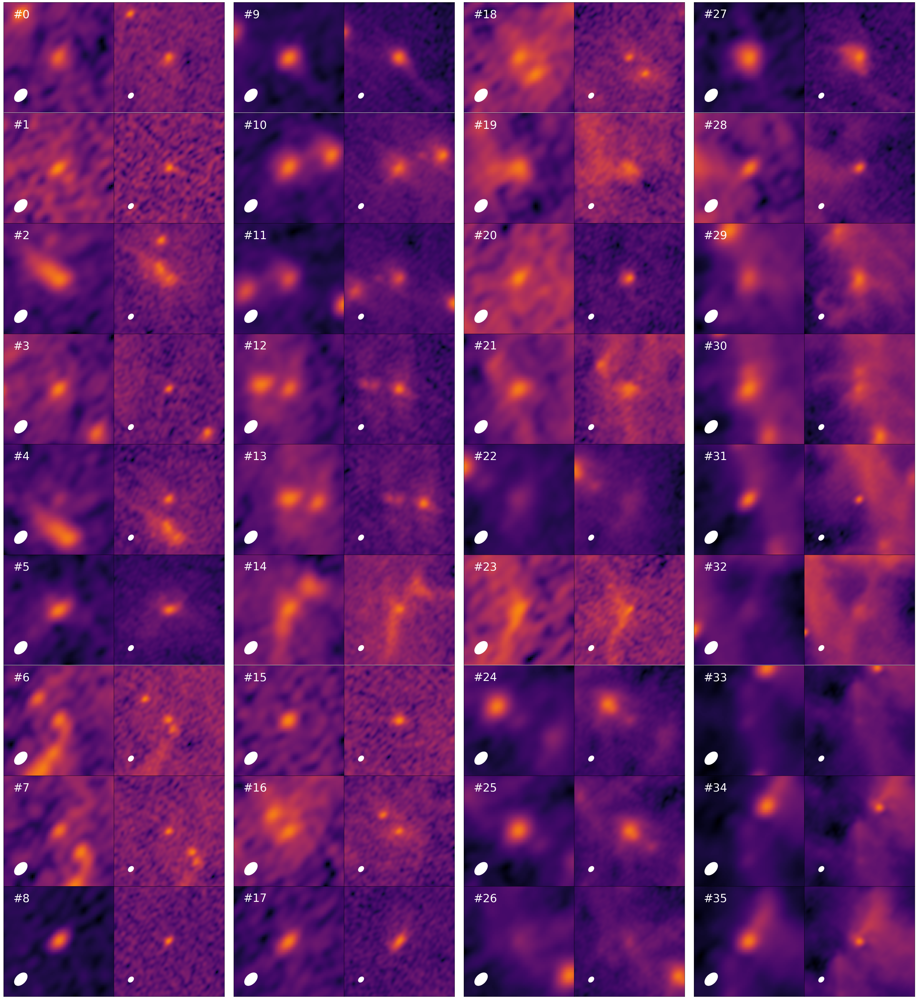

36 290.93283581557955 14.507894166643528 290.9328378239677 14.507895555523456 930116 2260351
37 290.93203040705674 14.508965553741877 290.9320355716581 14.508967775974341 930123 2260387
38 290.93345242405894 14.508969443936586 290.933455293244 14.50896999947614 930124 2260390
39 290.9333017870279 14.50920472198142 290.93330150000054 14.509205555305178 930126 2260511
40 290.93388626101455 14.50926888707522 290.93388913020686 14.509269998165058 930129 2260548
41 290.93365930048736 14.509307776746626 290.93364811016716 14.509308887880692 930133 2260553
42 290.9331873028754 14.509581944342363 290.9331924675019 14.509583333216197 930201 2260748
43 290.9329764099399 14.509611111119309 290.93298128763655 14.509612222220008 930195 2260752
44 290.93242206256986 14.509671388289053 290.93242464482876 14.50967333272936 930215 2260787
45 290.93306880121185 14.509747222205275 290.9330719573353 14.509747777749356 930222 2260806
46 290.93330178795094 14.509799721981429 290.93330379635927 14.5098011108

68 290.9317142805829 14.51214635028209 290.93171534174087 14.51214777450724 93019887 2261005
69 290.9315355194287 14.512490515940096 290.931538589116 14.512492217955888 93020446 2261006
70 290.92995277836206 14.513888556663131 290.92995470029115 14.513892203129354 93032447 2261008
71 290.93012752053045 14.513974114377591 290.93013259876085 14.51397664976906 93038322 2261009


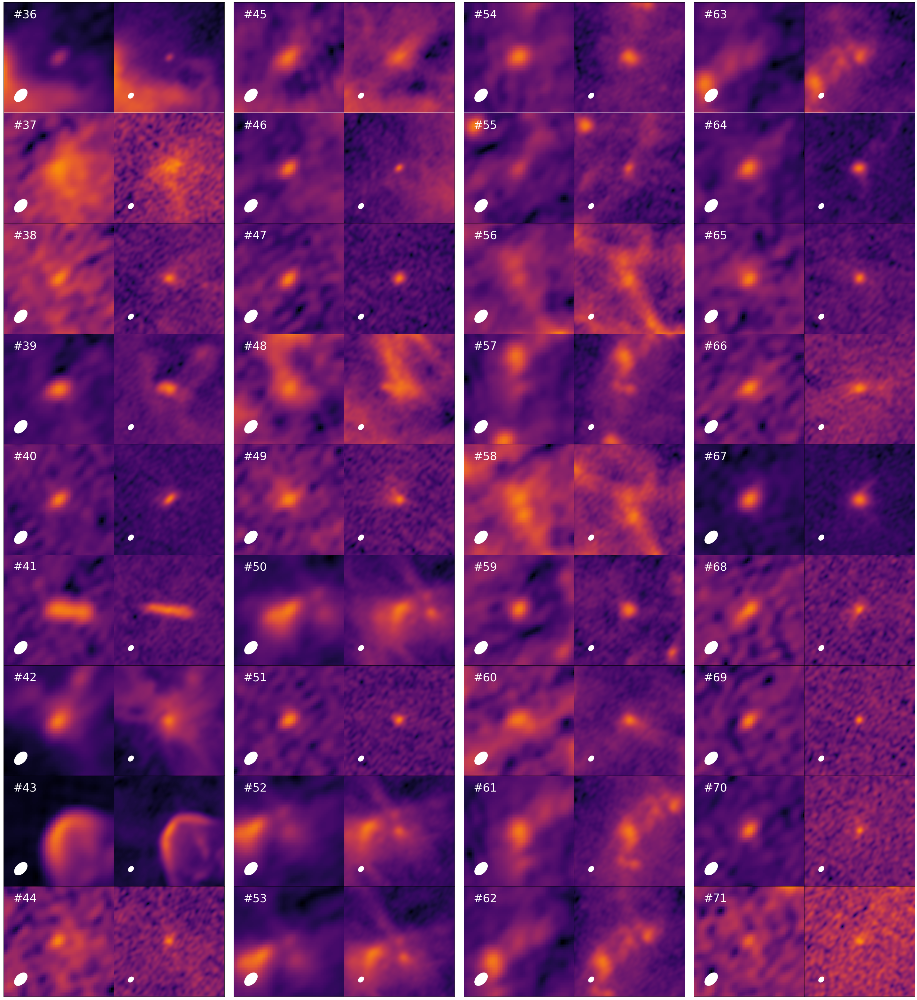

72 290.93092692062396 14.514020789271408 290.93092912952557 14.51402221350996 93028666 2261010
73 290.9300793144874 14.514049947128557 290.93008324498277 14.514052204729317 93033018 2261011
74 290.92995679291704 14.5140752233814 290.92995928871784 14.51407886985488 93032794 2261012
75 290.9323316912753 14.50563277695228 290.9323316912753 14.50563277695228 930005 
76 290.9326048425858 14.505873888630619 290.9326048425858 14.505873888630619 930007 
77 290.93264501059616 14.506863610911164 290.93264501059616 14.506863610911164 930030 
78 290.9326028322829 14.507015277518263 290.9326028322829 14.507015277518263 930034 
79 290.93331182623484 14.507139721965851 290.93331182623484 14.507139721965851 930044 
80 290.93296636736534 14.508166388897484 290.93296636736534 14.508166388897484 930120 
81 290.93231360702663 14.5083919435734 290.93231360702663 14.5083919435734 930121 
82 290.93352272116846 14.508835277112416 290.93352272116846 14.508835277112416 930122 
83 290.9324923587054 14.510402499

105 290.9340830949199 14.509441108432242 290.9340830949199 14.509441108432242  2260671
106 290.93145482520146 14.50947332854744 290.93145482520146 14.50947332854744  2260692
107 290.9329250494962 14.509717777774336 290.9329250494962 14.509717777774336  2260803


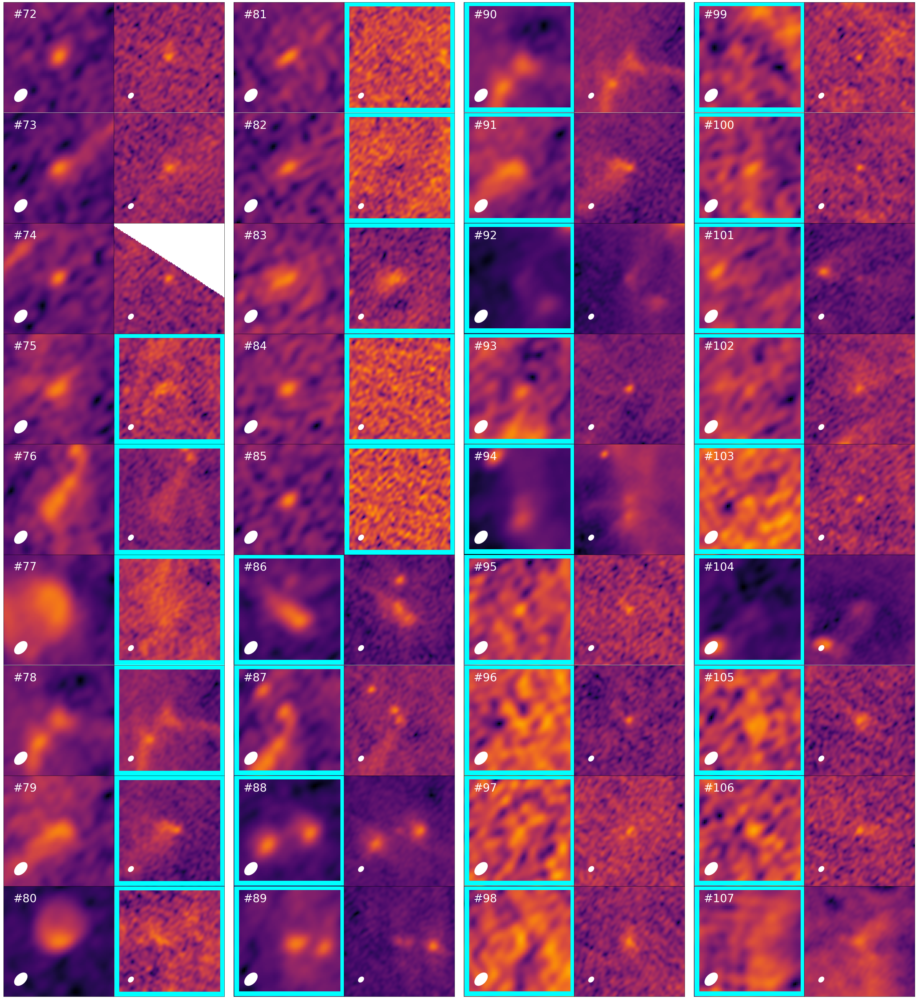

0 0
-1.0 -1.0 -1.0
0 1
-1.0 -1.0 -1.0
0 2
-1.0 -1.0 -1.0
0 3
-1.0 -1.0 -1.0
0 4
-1.0 -1.0 -1.0
0 5
-1.0 -1.0 2.314564609189e-05
0 6
-1.0 -1.0 1.0007921176064015e-05
0 7
-1.0 -1.0 1.320325225588978e-05
1 0
-1.0 -1.0 4.659608935488501e-05
1 1
290.9286732910952 14.516223814707706 1.2799503384596905e-05
1 2
290.9303825921114 14.515134950634296 2.1661027946548285e-05
1 3
290.92681145678404 14.512445718027639 2.004533438450675e-05
1 4
290.9247227338445 14.508455654437988 3.503181826843286e-05
1 5
290.9228429852831 14.504037803632217 3.466569596172166e-05
1 6
290.9277456925468 14.501008518231671 2.0647677276850485e-05
1 7
290.92755088576774 14.50057490273605 7.174406125097801e-05
2 0
290.9300250815123 14.514221057573023 4.8572702573901185e-05
2 1
290.9298603694228 14.51502799991797 3.2161571528810714e-05
2 2
290.92965348814164 14.515045497114325 8.332785785007298e-06
2 3
290.9262088099746 14.515323479364543 1.792446511602373e-05
2 4
290.925903516982 14.515086248220923 5.4017154043656284e-05
2

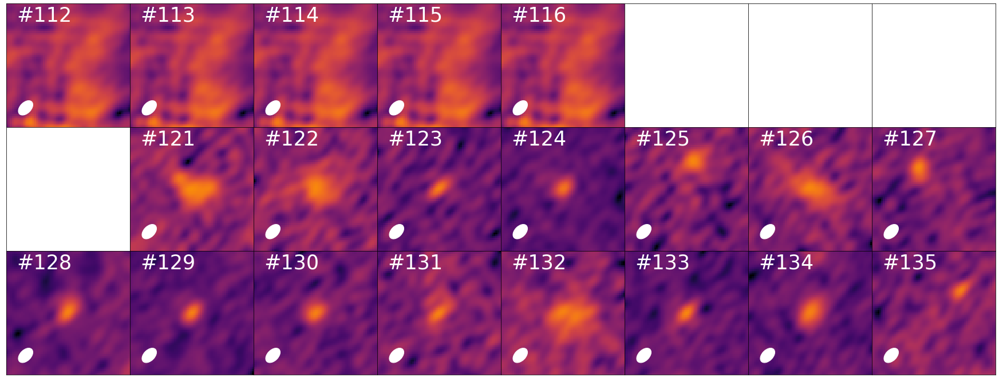